<a href="https://colab.research.google.com/github/romapaz/Reentrega-trabajo-final---61170/blob/main/5_Entrega_final_Paz.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

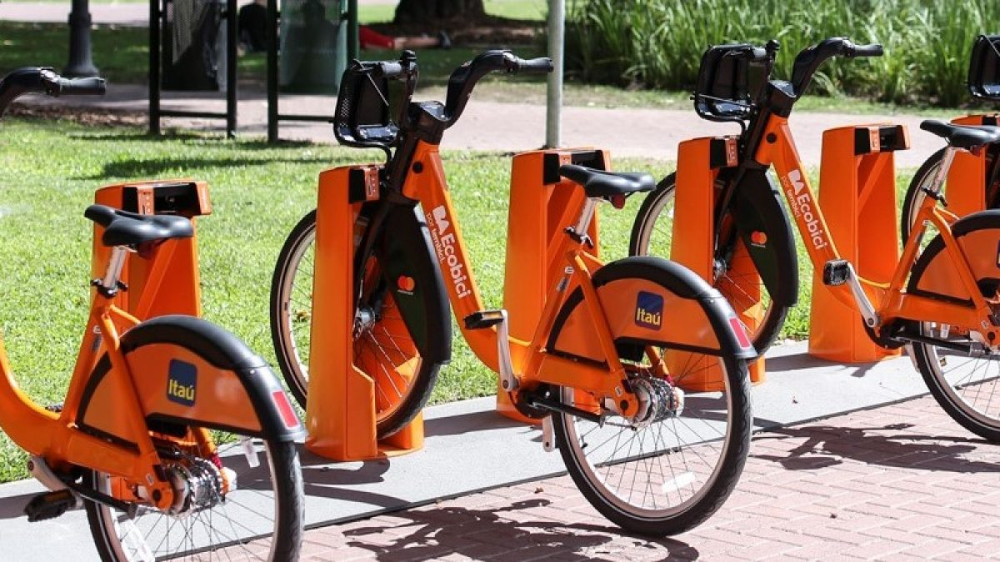

# Presentación del problema

**Abstracto con motivación y audiencia**

Este trabajo propone explorar los patrones de uso del sistema de bicicletas compartidas en CABA -mes de marzo 2023-, siendo un servicio popular en entornos urbanos. Aprovechando un conjunto de datos que comprende cientos de viajes, realizamos un análisis para identificar tendencias, períodos de máxima demanda y preferencias demográficas. Aplicando algoritmos de aprendizaje automático, predecimos los factores que influyen en la demanda de bicicletas, como las condiciones climáticas, la hora del día. El objetivo es poder optimizar la distribución de bicicletas y la ubicación de estaciones, lo que podría mejorar la eficiencia operativa y la satisfacción del usuario. Este trabajo busca contribuir a la comprensión de la movilidad urbana y apoyar el desarrollo de sistemas de transporte sostenible en las grandes ciudades.

**Objetivo**

Considerando la variable objetivo "duracion_recorrido", se buscará entender los patrones de uso del servicio, con el objetivo de poder satisfacer la demanda del servicio y entender los factores que pueden influir en la demanda.

# Lectura de datos

Librerias necesarias para el analisis de datos

In [ ]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

Lectura del dataset

In [ ]:
# dataset
url = "https://docs.google.com/uc?id="
ext = "1oU97klw3HC3RN8A15nAHTqXq1KbHwawt"
df = pd.read_excel (url+ext)

# https://docs.google.com/spreadsheets/d/1oU97klw3HC3RN8A15nAHTqXq1KbHwawt/edit?usp=sharing&ouid=111647596649871138461&rtpof=true&sd=true

Analisis inicial del dataset

In [ ]:
# Se revisa cuantas lineas y columnas tiene el dataset y caracteristicas generales para identificar cambios que se deben realizar para el analisis.
df.shape

(103419, 26)

In [ ]:
df.count()

,0
ID,103419
Id_recorrido,103419
duracion_recorrido,103419
fecha_origen_recorrido,103419
TMAX,103419
TMIN,103419
id_estacion_origen,103419
nombre_estacion_origen,103419
Barrio,103419
Comuna,103419


In [ ]:
df.head()

,ID,Id_recorrido,duracion_recorrido,fecha_origen_recorrido,TMAX,TMIN,id_estacion_origen,nombre_estacion_origen,Barrio,Comuna,...,nombre_estacion_destino,Barrio.1,Comuna.1,Emplazamiento.1,direccion_estacion_destino,long_estacion_destino,lat_estacion_destino,id_usuario,modelo_bicicleta,genero
0,2,17600256BAEcobici,288,2023-03-22 17:40:55,26.7,19.8,444BAEcobici,061 - Ministerio de Economia,MONSERRAT,COMUNA 1,...,003 - ADUANA,MONSERRAT,COMUNA 1,VEREDA,Moreno & Azopardo,-583681738028771,-34611102140682,217525BAEcobici,ICONIC,FEMALE
1,46,17549568BAEcobici,1097,2023-03-17 13:31:04,33.4,25.0,482BAEcobici,376 - PASEO DE LA COSTANERA,PALERMO,COMUNA 14,...,245 - COSTANERA NORTE,PALERMO,COMUNA 14,VEREDA,AV. Costanera Rafael del Obligado 1700,-58402021,-3456477054,871960BAEcobici,ICONIC,MALE
2,72,17656332BAEcobici,521,2023-03-28 18:15:46,30.7,20.9,489BAEcobici,288 - SECRETARÃ_x008d_A DE DEPORTES,NUÑEZ,COMUNA 13,...,399 - GARCIA DEL RIO,SAAVEDRA,COMUNA 12,PLAZA,Av. GarcÃ­a del RÃ­o 3182,-58477,-345503,245898BAEcobici,ICONIC,MALE
3,77,17602049BAEcobici,1462,2023-03-22 19:18:39,26.7,19.8,177BAEcobici,177 -PLANETARIO,PALERMO,COMUNA 14,...,014 - Pacifico,PALERMO,COMUNA 14,VEREDA,"Santa Fe Av. & Bullrich, Int. Av.",-58426387,-34577424,968979BAEcobici,ICONIC,MALE
4,80,17511071BAEcobici,194,2023-03-14 10:02:10,37.0,27.6,236BAEcobici,254 - Plaza Rafael Hernandez,BELGRANO,COMUNA 13,...,255 - BARRANCAS DE BELGRANO,BELGRANO,COMUNA 13,PLAZA,"Sucre, Antonio Jose De, Mcal. Y Vertiz Virrey Av.",-58448314,-34559801,136569BAEcobici,ICONIC,MALE


In [ ]:
df.sample(7)

,ID,Id_recorrido,duracion_recorrido,fecha_origen_recorrido,TMAX,TMIN,id_estacion_origen,nombre_estacion_origen,Barrio,Comuna,...,nombre_estacion_destino,Barrio.1,Comuna.1,Emplazamiento.1,direccion_estacion_destino,long_estacion_destino,lat_estacion_destino,id_usuario,modelo_bicicleta,genero
78465,775813,17524417BAEcobici,754,2023-03-15 12:24:55,30.6,26.6,137BAEcobici,137 - AZOPARDO Y CHILE,MONSERRAT,COMUNA 1,...,091 - Pasco,BALVANERA,COMUNA 3,CALZADA,708 Pasco & Chile,-58397602,-346174482,794087BAEcobici,FIT,MALE
46783,457772,17543441BAEcobici,654,2023-03-16 23:11:16,31.6,24.1,82BAEcobici,082 - HOSPITAL ITALIANO,ALMAGRO,COMUNA 5,...,186 - MANZANA 66,BALVANERA,COMUNA 3,PLAZA,2875 Moreno,-584064415,-346136356,790225BAEcobici,ICONIC,MALE
13858,136071,17581793BAEcobici,984,2023-03-21 10:31:36,27.0,20.1,41BAEcobici,041 - PARQUE PATRICIOS II,PARQUE PATRICIOS,COMUNA 4,...,092 - Salcedo,PARQUE PATRICIOS,COMUNA 4,CALZADA,2908 Salcedo & Dean Funes,-584053386,-346316444,245751BAEcobici,ICONIC,MALE
57494,562011,17653710BAEcobici,840,2023-03-28 15:55:35,30.7,20.9,30BAEcobici,030 - PeÃ±a,RECOLETA,COMUNA 2,...,083 - ParanÃ¡,SAN NICOLAS,COMUNA 1,CALZADA,1590 Lavalle,-583893728,-34603269,906628BAEcobici,ICONIC,MALE
3201,31655,17636788BAEcobici,12,2023-03-27 11:14:33,25.9,17.4,368BAEcobici,378 - AGRONOMIA,AGRONOMIA,COMUNA 15,...,203 - Beiro,VILLA DEVOTO,COMUNA 11,VEREDA,"Beiro 3572, CABA",-5850335,-346008,926143BAEcobici,ICONIC,MALE
37102,364011,17548630BAEcobici,812,2023-03-17 11:58:54,33.4,25.0,200BAEcobici,200 - AUSTRIA Y FRENCH,RECOLETA,COMUNA 2,...,054 - AcuÃ±a de Figueroa,ALMAGRO,COMUNA 5,CALZADA,Lavalle 4015,-584220694,-345982097,670148BAEcobici,ICONIC,MALE
25468,250194,17502385BAEcobici,484,2023-03-13 16:54:18,35.0,27.0,239BAEcobici,391 - Plaza RepÃºblica de Ecuador,PALERMO,COMUNA 14,...,014 - Pacifico,PALERMO,COMUNA 14,VEREDA,"Santa Fe Av. & Bullrich, Int. Av.",-58426387,-34577424,253193BAEcobici,ICONIC,OTHER


In [ ]:
df.tail()

,ID,Id_recorrido,duracion_recorrido,fecha_origen_recorrido,TMAX,TMIN,id_estacion_origen,nombre_estacion_origen,Barrio,Comuna,...,nombre_estacion_destino,Barrio.1,Comuna.1,Emplazamiento.1,direccion_estacion_destino,long_estacion_destino,lat_estacion_destino,id_usuario,modelo_bicicleta,genero
103414,1048554,17692114BAEcobici,559,2023-03-31 15:41:55,22.9,16.5,174BAEcobici,174 - MINISTERIO DE EDUCACION,RECOLETA,COMUNA 2,...,085 - AGUERO,RECOLETA,COMUNA 2,CALZADA,"Aguero & Mansilla, Lucio Norberto, General",-584091784,-345948057,776748BAEcobici,FIT,FEMALE
103415,1048559,17667989BAEcobici,442,2023-03-29 16:11:07,29.0,19.0,101BAEcobici,101 - Fitz Roy,CHACARITA,COMUNA 15,...,182 - RAVIGNANI Y GUATEMALA,PALERMO,COMUNA 14,CALZADA,"2185 Ravignani, Emilio, Dr. & Guatemala",-584352466,-345780479,962777BAEcobici,FIT,MALE
103416,1048567,17600488BAEcobici,1288,2023-03-22 17:52:15,26.7,19.8,210BAEcobici,335 - General Urquiza,PALERMO,COMUNA 14,...,344 - UNIVERSIDAD DI TELLA,BELGRANO,COMUNA 13,VEREDA,Figueroa Alcorta 7350,-584469439,-345480059,765840BAEcobici,FIT,MALE
103417,1048569,17648585BAEcobici,836,2023-03-28 08:17:31,30.7,20.9,212BAEcobici,129 - Velasco,VILLA CRESPO,COMUNA 15,...,144 - PUEYRREDÃ“N,BALVANERA,COMUNA 3,CALZADA,684 Boulogne Sur Mer & Tucuman,-584060944,-346018744,74218BAEcobici,FIT,MALE
103418,1048570,17648567BAEcobici,1989,2023-03-28 08:15:41,30.7,20.9,408BAEcobici,364 - CERRETTI Y MANUELA PEDRAZA,VILLA URQUIZA,COMUNA 12,...,247 - PLAZA LUCIO DEMARE,NUÑEZ,COMUNA 13,CALZADA,O`Higgins 3750,-5846514,-3454569,225658BAEcobici,FIT,MALE


In [ ]:
df.dtypes.value_counts()

,count
object,16
int64,6
datetime64[ns],2
float64,2


In [ ]:
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103419 entries, 0 to 103418
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   ID                          103419 non-null  int64         
 1   Id_recorrido                103419 non-null  object        
 2   duracion_recorrido          103419 non-null  int64         
 3   fecha_origen_recorrido      103419 non-null  datetime64[ns]
 4   TMAX                        103419 non-null  float64       
 5   TMIN                        103419 non-null  float64       
 6   id_estacion_origen          103419 non-null  object        
 7   nombre_estacion_origen      103419 non-null  object        
 8   Barrio                      103419 non-null  object        
 9   Comuna                      103419 non-null  object        
 10  Emplazamiento               103419 non-null  object        
 11  direccion_estacion_origen   103419 non-

,ID,duracion_recorrido,fecha_origen_recorrido,TMAX,TMIN,long_estacion_origen,lat_estacion_origen,fecha_destino_recorrido,long_estacion_destino,lat_estacion_destino
count,1.034190e+05,1.034190e+05,103419,103419.000000,103419.000000,1.034190e+05,1.034190e+05,103419,1.034190e+05,1.034190e+05
mean,5.117649e+05,1.184596e+03,2023-03-22 17:37:08.769094912,29.175603,21.024647,-4.084515e+13,-2.289899e+13,2023-03-22 17:58:21.331979520,-4.183182e+13,-2.363546e+13
min,2.000000e+00,1.000000e+00,2023-03-13 00:01:18,22.900000,14.200000,-5.851978e+14,-3.467948e+14,2023-03-13 00:08:24,-5.851978e+14,-3.467948e+14
25%,2.542500e+05,5.090000e+02,2023-03-17 07:46:23.500000,26.700000,18.500000,-5.841968e+08,-3.460971e+08,2023-03-17 08:01:36.500000,-5.841982e+08,-3.461089e+08
50%,5.058370e+05,8.330000e+02,2023-03-22 15:02:15,29.000000,20.200000,-5.837790e+08,-3.458512e+08,2023-03-22 15:24:30,-5.837453e+08,-3.458512e+08
75%,7.655680e+05,1.356000e+03,2023-03-28 08:56:50.500000,31.600000,24.400000,-5.842639e+07,-3.459722e+07,2023-03-28 09:12:34,-5.842639e+07,-3.459722e+07
max,1.048570e+06,1.699442e+06,2023-03-31 23:59:44,37.000000,27.600000,-5.840600e+04,-3.454100e+04,2023-04-14 14:58:04,-5.840600e+04,-3.454100e+04
std,2.996095e+05,6.587274e+03,NaN,3.789182,3.900830,1.487920e+14,8.562187e+13,NaN,1.504402e+14,8.692499e+13


In [ ]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
ID,103419.0,511764.945977,2.0,254250.0,505837.0,765568.0,1048570.0,299609.480831
duracion_recorrido,103419.0,1184.595519,1.0,509.0,833.0,1356.0,1699442.0,6587.273995
fecha_origen_recorrido,103419,2023-03-22 17:37:08.769094912,2023-03-13 00:01:18,2023-03-17 07:46:23.500000,2023-03-22 15:02:15,2023-03-28 08:56:50.500000,2023-03-31 23:59:44,NaN
TMAX,103419.0,29.175603,22.9,26.7,29.0,31.6,37.0,3.789182
TMIN,103419.0,21.024647,14.2,18.5,20.2,24.4,27.6,3.90083
long_estacion_origen,103419.0,-40845153649026.179688,-585197809873066.0,-584196761.0,-583779002.0,-58426387.0,-58406.0,148791980694988.4375
lat_estacion_origen,103419.0,-22898989495564.652344,-346794832416957.0,-346097105.0,-345851209.0,-34597225.0,-34541.0,85621867850868.71875
fecha_destino_recorrido,103419,2023-03-22 17:58:21.331979520,2023-03-13 00:08:24,2023-03-17 08:01:36.500000,2023-03-22 15:24:30,2023-03-28 09:12:34,2023-04-14 14:58:04,NaN
long_estacion_destino,103419.0,-41831824489449.734375,-585197809873066.0,-584198163.0,-583745346.0,-58426387.0,-58406.0,150440240439813.0
lat_estacion_destino,103419.0,-23635462091575.683594,-346794832416957.0,-346108915.0,-345851209.0,-34597225.0,-34541.0,86924988305323.109375


In [ ]:
df.describe(include= ['object']).T

,count,unique,top,freq
Id_recorrido,103419,103419,17600256BAEcobici,1
id_estacion_origen,103419,316,175BAEcobici,1470
nombre_estacion_origen,103419,316,147 - ConstituciÃ³n,1470
Barrio,103419,46,PALERMO,16441
Comuna,103419,15,COMUNA 1,26259
Emplazamiento,103419,6,CALZADA,40196
direccion_estacion_origen,103419,316,Avenida Juan de Garay 1050,1470
id_estacion_destino,103419,317,128BAEcobici,1193
nombre_estacion_destino,103419,317,128 - PARQUE DEL BAJO,1193
Barrio.1,103419,47,PALERMO,16705


**Descripción de variables**

**ID=** Registro único.

**ID recorrido=** ID único del recorrido.

***Duración*** (Variable objetivo)**=** Tiempo del recorrido en segundos.

**Fecha origen recorrido=** Fecha y hora cuando comienza el recorrido.

**TMAX=** Temperatura máxima del día.

**TMIN=** Temperatura mínima del día.

**ID_Estación origen=** ID unico de la estación.

**Nombre estación origen=** Nombre descriptivo que identifica la estación.

**Barrio=** Nombre del barrio que se ubica la estación de origen.

**Comuna=** Nombre de la comuna donde se ubica la estación de origen.

**Emplazamiento=** Espacio en que se ubica la estación de origen.

**Dirección=** Ubicación de la estación por calles

**Longitud=** Punto longitudinal de la ubicación de la estación de origen.

**Latitud=** Punto latitudinal de la ubicación de la estación de origen.

**Fecha destino=** Fecha y hora que se llega al destino.

**ID_Estación destino=** ID unico de la estación destino.

**Nombe estación destino=** Nombre descriptivo que identifica la estación.

**Barrio=** Nombre del barrio que se ubica la estación de destino.

**Comuna=** Nombre de la comuna donde se ubica la estación de destino.

**Emplazamiento=** Espacio en que se ubica la estación de destino.

**Dirección=** Ubicación de la estación por calles de la estación destino.

**Longitud=** Punto longitudinal de la ubicación de la estación destino.

**Latitud=** Punto latitudinal de la ubicación de la estación destino.

**ID_ usuario=** identificación del usuario de la bicicleta.

**Modelo bicicleta=** Modelos disponibles.

**Género=** Genero del usuario.

# Pre-procesamiento de datos: limpieza y transformación

Valores duplicados

In [ ]:
# Se busca si hay valores duplicados, en este caso no
df.duplicated().sum()

0

Valores nulos

In [ ]:
# Se busca identificar valores nulos para definir el tratamiento
df.isnull().sum()

,0
ID,0
Id_recorrido,0
duracion_recorrido,0
fecha_origen_recorrido,0
TMAX,0
TMIN,0
id_estacion_origen,0
nombre_estacion_origen,0
Barrio,0
Comuna,0


In [ ]:
# Se consulta el porcentaje de incidencia de esos datos nulos
null_porciento = 100*(df.isnull().sum()/len(df))
null_porciento = null_porciento[null_porciento>0].sort_values()
null_porciento

,0
genero,0.391611


Se toma la decision de reemplazar los datos nulos de la columna género, al ser datos no numéricos se reemplaza con la categoría "other".

In [ ]:
# Se reemplaza el dato nulo de la columna con el criterio "other"
df['genero'].fillna('other', inplace=True)

In [ ]:
df.isnull().sum()

,0
ID,0
Id_recorrido,0
duracion_recorrido,0
fecha_origen_recorrido,0
TMAX,0
TMIN,0
id_estacion_origen,0
nombre_estacion_origen,0
Barrio,0
Comuna,0


In [ ]:
# Se consulta los titulos de las columnas para trabajar
print(df.columns)

Index(['ID', 'Id_recorrido', 'duracion_recorrido', 'fecha_origen_recorrido',
       'TMAX', 'TMIN', 'id_estacion_origen', 'nombre_estacion_origen',
       'Barrio', 'Comuna', 'Emplazamiento', 'direccion_estacion_origen',
       'long_estacion_origen', 'lat_estacion_origen',
       'fecha_destino_recorrido', 'id_estacion_destino',
       'nombre_estacion_destino', 'Barrio.1', 'Comuna.1', 'Emplazamiento.1',
       'direccion_estacion_destino', 'long_estacion_destino',
       'lat_estacion_destino', 'id_usuario', 'modelo_bicicleta', 'genero'],
      dtype='object')


In [ ]:
# Se convierte la fecha de origen del recorrido
df['fecha_origen_recorrido'] = pd.to_datetime(df['fecha_origen_recorrido'])

In [ ]:
print("DataFrame original:")
print(df)

DataFrame original:
             ID       Id_recorrido  duracion_recorrido fecha_origen_recorrido  \
0             2  17600256BAEcobici                 288    2023-03-22 17:40:55   
1            46  17549568BAEcobici                1097    2023-03-17 13:31:04   
2            72  17656332BAEcobici                 521    2023-03-28 18:15:46   
3            77  17602049BAEcobici                1462    2023-03-22 19:18:39   
4            80  17511071BAEcobici                 194    2023-03-14 10:02:10   
...         ...                ...                 ...                    ...   
103414  1048554  17692114BAEcobici                 559    2023-03-31 15:41:55   
103415  1048559  17667989BAEcobici                 442    2023-03-29 16:11:07   
103416  1048567  17600488BAEcobici                1288    2023-03-22 17:52:15   
103417  1048569  17648585BAEcobici                 836    2023-03-28 08:17:31   
103418  1048570  17648567BAEcobici                1989    2023-03-28 08:15:41   

       

In [ ]:
# Se convierte en valor numerico los días de la semana 0=lunes a 7=domingo
df['Día de la Semana(numerico)'] = df['fecha_origen_recorrido'].dt.weekday

print("\nDataFrame con días de la semana numerico:")
print(df)


DataFrame con días de la semana numerico:
             ID       Id_recorrido  duracion_recorrido fecha_origen_recorrido  \
0             2  17600256BAEcobici                 288    2023-03-22 17:40:55   
1            46  17549568BAEcobici                1097    2023-03-17 13:31:04   
2            72  17656332BAEcobici                 521    2023-03-28 18:15:46   
3            77  17602049BAEcobici                1462    2023-03-22 19:18:39   
4            80  17511071BAEcobici                 194    2023-03-14 10:02:10   
...         ...                ...                 ...                    ...   
103414  1048554  17692114BAEcobici                 559    2023-03-31 15:41:55   
103415  1048559  17667989BAEcobici                 442    2023-03-29 16:11:07   
103416  1048567  17600488BAEcobici                1288    2023-03-22 17:52:15   
103417  1048569  17648585BAEcobici                 836    2023-03-28 08:17:31   
103418  1048570  17648567BAEcobici                1989    2023-03-

In [ ]:
# Se Cambia el tipo de dato de la columna 'duracion_recorrido' a numérico
df['duracion_recorrido'] = pd.to_numeric(df['duracion_recorrido'], errors='coerce')

In [ ]:
# Se consulta el cambio

print(df['duracion_recorrido'].dtype)

int64


In [ ]:
# Se categoriza la columna genero en dato numerico 0=female 1=Male 2=Other
le = LabelEncoder()

df['genero_encoded'] = le.fit_transform(df['genero'])

# Se verifica el cambio
print(df[['genero', 'genero_encoded']].head())


   genero  genero_encoded
0  FEMALE               0
1    MALE               1
2    MALE               1
3    MALE               1
4    MALE               1


In [ ]:
# Se realiza el mismo proceso con otras columnas
le = LabelEncoder()
df['id_estacion_origen_encoded'] = le.fit_transform(df['id_estacion_origen'])
print(df[['id_estacion_origen', 'id_estacion_origen_encoded']].head())

  id_estacion_origen  id_estacion_origen_encoded
0       444BAEcobici                         225
1       482BAEcobici                         256
2       489BAEcobici                         263
3       177BAEcobici                          50
4       236BAEcobici                          94


In [ ]:
le = LabelEncoder()
df['id_estacion_destino_encoded'] = le.fit_transform(df['id_estacion_destino'])
print(df[['id_estacion_destino', 'id_estacion_destino_encoded']].head())

  id_estacion_destino  id_estacion_destino_encoded
0          3BAEcobici                          197
1        490BAEcobici                          265
2        268BAEcobici                          118
3         14BAEcobici                           28
4        289BAEcobici                          131


In [ ]:
le = LabelEncoder()
df['Barrio_encoded'] = le.fit_transform(df['Barrio'])
print(df[['Barrio', 'Barrio_encoded']].head())

      Barrio  Barrio_encoded
0  MONSERRAT              17
1    PALERMO              21
2      NUÑEZ              20
3    PALERMO              21
4   BELGRANO               4


In [ ]:
le = LabelEncoder()
df['Barrio.1_encoded'] = le.fit_transform(df['Barrio.1'])
print(df[['Barrio.1', 'Barrio.1_encoded']].head())

    Barrio.1  Barrio.1_encoded
0  MONSERRAT                18
1    PALERMO                22
2   SAAVEDRA                30
3    PALERMO                22
4   BELGRANO                 5


In [ ]:
# Se consulta como quedan los datos antes de continuar
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103419 entries, 0 to 103418
Data columns (total 32 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   ID                           103419 non-null  int64         
 1   Id_recorrido                 103419 non-null  object        
 2   duracion_recorrido           103419 non-null  int64         
 3   fecha_origen_recorrido       103419 non-null  datetime64[ns]
 4   TMAX                         103419 non-null  float64       
 5   TMIN                         103419 non-null  float64       
 6   id_estacion_origen           103419 non-null  object        
 7   nombre_estacion_origen       103419 non-null  object        
 8   Barrio                       103419 non-null  object        
 9   Comuna                       103419 non-null  object        
 10  Emplazamiento                103419 non-null  object        
 11  direccion_estacion_origen 

In [ ]:
# Se consulta interquartil para ver outlier
Q1 = df['duracion_recorrido'].quantile(0.25)
Q3 = df['duracion_recorrido'].quantile(0.75)

# Se calcula el rango intercuartílico (IQR)
IQR = Q3 - Q1

# Se define límites inferiores y superiores para detectar outliers
limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

# Se identifican los outliers
outliers = df[(df['duracion_recorrido'] < limite_inferior) | (df['duracion_recorrido'] > limite_superior)]

print(f"Límite inferior: {limite_inferior}")
print(f"Límite superior: {limite_superior}")
print("Outliers encontrados:")
print(outliers)

Límite inferior: -761.5
Límite superior: 2626.5
Outliers encontrados:
             ID       Id_recorrido  duracion_recorrido fecha_origen_recorrido  \
9           147  17596415BAEcobici                2647    2023-03-22 13:07:00   
33          390  17562883BAEcobici                2923    2023-03-19 09:47:46   
37          440  17659519BAEcobici                2949    2023-03-28 22:06:11   
52          551  17622470BAEcobici                3177    2023-03-24 21:38:54   
58          583  17501726BAEcobici                3885    2023-03-13 16:02:54   
...         ...                ...                 ...                    ...   
103308  1047513  17580015BAEcobici                3196    2023-03-21 07:55:33   
103327  1047728  17644380BAEcobici                3401    2023-03-27 19:59:08   
103334  1047789  17614179BAEcobici                3467    2023-03-23 18:27:43   
103343  1047902  17613122BAEcobici                2677    2023-03-23 17:23:19   
103387  1048304  17512855BAEcobici     

In [ ]:
#  Se realiza la visualización de boxplot de outlier. Se seleccionana solo las columnas numéricas
numeric_cols = df.select_dtypes(include=np.number).columns

# Se crea un boxplot para cada columna numérica
for col in numeric_cols:
  fig = px.box(df, y=col, title=f"Boxplot de {col}")
  fig.show()

In [ ]:
# Se reemplaza los outliers con la mediana
mediana = df['duracion_recorrido'].median()
df['duracion_recorrido'] = np.where((df['duracion_recorrido'] < limite_inferior) | (df['duracion_recorrido'] > limite_superior),
                                   mediana, df['duracion_recorrido'])

In [ ]:
numeric_cols = df.select_dtypes(include=np.number).columns

# Se cre un boxplot para cada columna numérica
for col in numeric_cols:
  fig = px.box(df, y=col, title=f"Boxplot de {col}")
  fig.show()

# Analisis exploratorio de datos

Analisis univariado

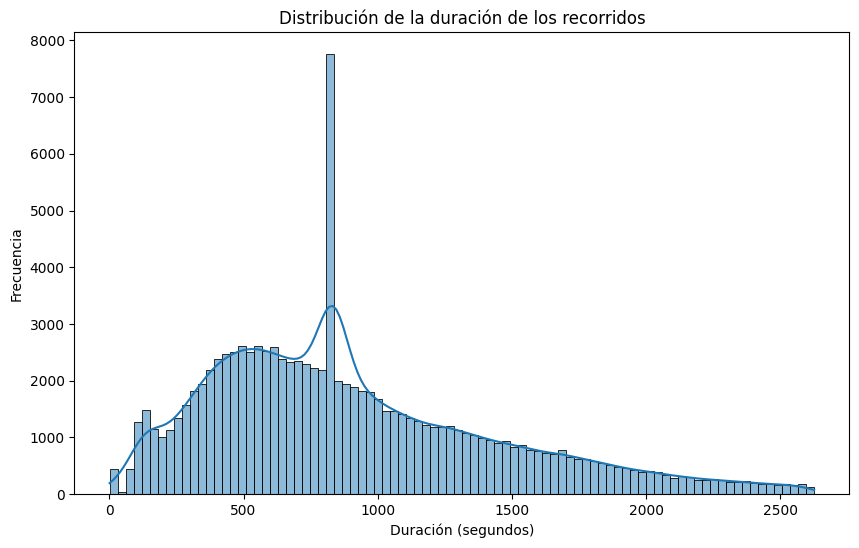

In [ ]:
# Análisis univariado de la duración de los recorridos
plt.figure(figsize=(10, 6))
sns.histplot(df['duracion_recorrido'], kde=True)
plt.title('Distribución de la duración de los recorridos')
plt.xlabel('Duración (segundos)')
plt.ylabel('Frecuencia')
plt.show()

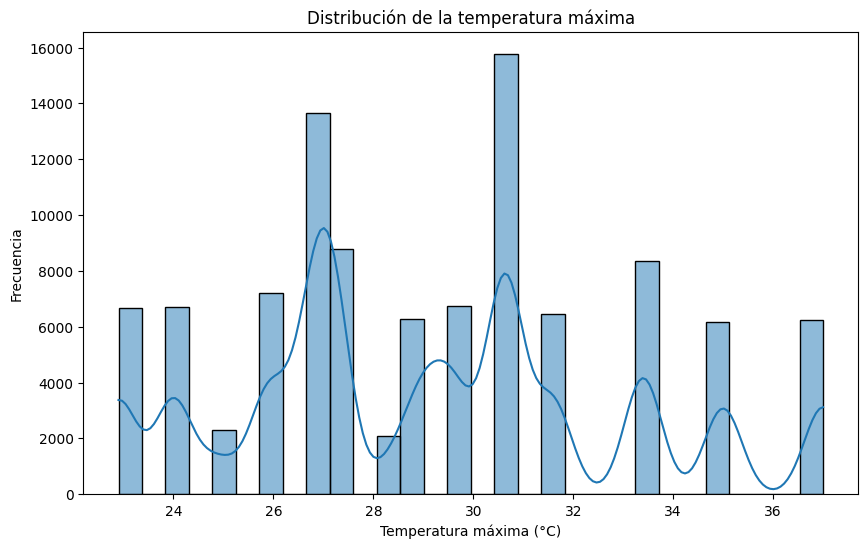

In [ ]:
# Visualizamos la distribución de la temperatura máxima.
plt.figure(figsize=(10, 6))
sns.histplot(df['TMAX'], bins=30, kde=True)
plt.title('Distribución de la temperatura máxima')
plt.xlabel('Temperatura máxima (°C)')
plt.ylabel('Frecuencia')
plt.show()


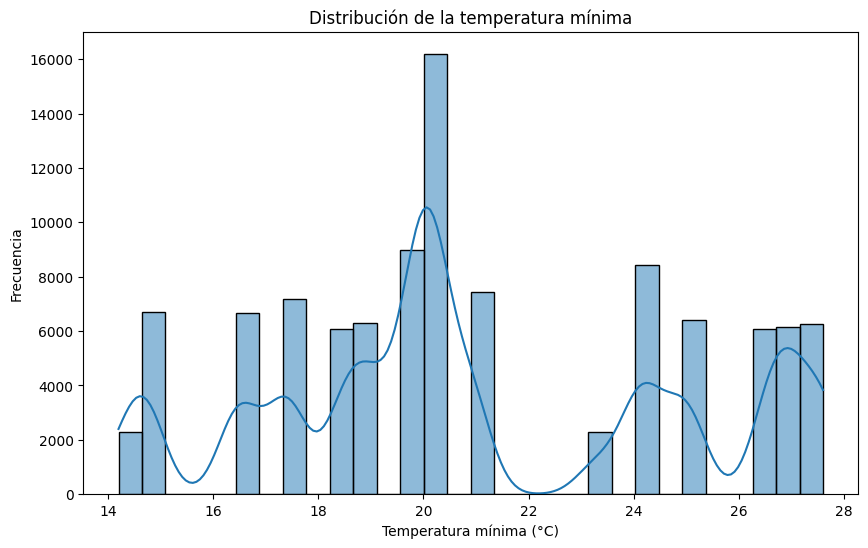

In [ ]:
# Visualizamos la distribución de la temperatura mínima.
plt.figure(figsize=(10, 6))
sns.histplot(df['TMIN'], bins=30, kde=True)
plt.title('Distribución de la temperatura mínima')
plt.xlabel('Temperatura mínima (°C)')
plt.ylabel('Frecuencia')
plt.show()


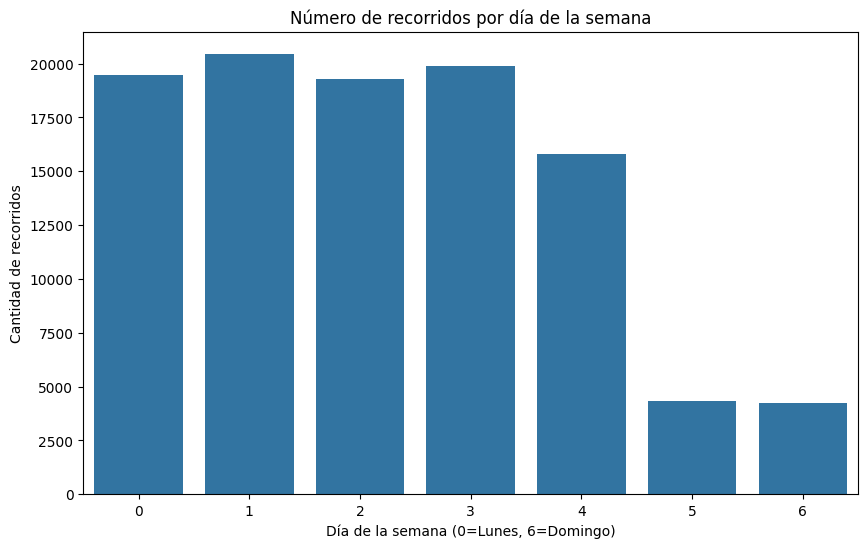

In [ ]:
# Análisis univariado de los recorridos por día de la semana
plt.figure(figsize=(10, 6))
sns.countplot(x='Día de la Semana(numerico)', data=df)
plt.title('Número de recorridos por día de la semana')
plt.xlabel('Día de la semana (0=Lunes, 6=Domingo)')
plt.ylabel('Cantidad de recorridos')
plt.show()


Analisis bivariado

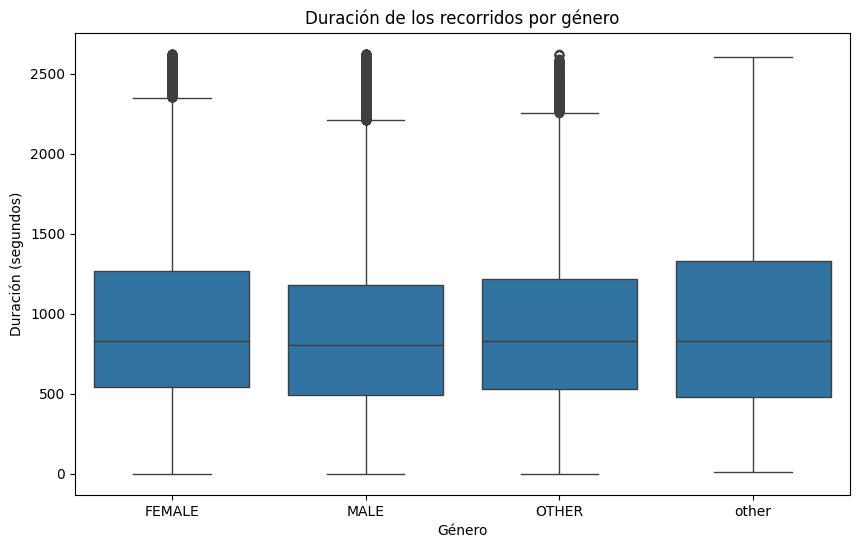

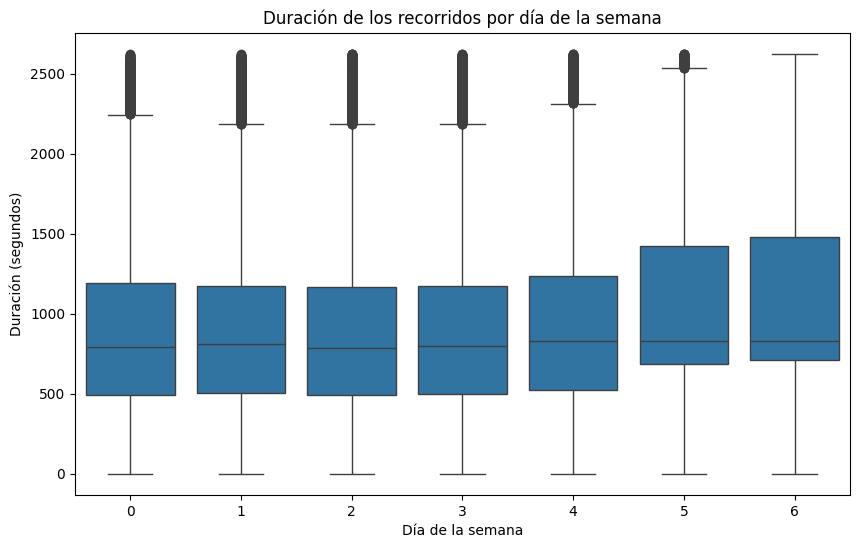

In [ ]:
# Análisis bivariado de la duración de los recorridos por género
plt.figure(figsize=(10, 6))
sns.boxplot(x='genero', y='duracion_recorrido', data=df)
plt.title('Duración de los recorridos por género')
plt.xlabel('Género')
plt.ylabel('Duración (segundos)')
plt.show()

# Análisis bivariado de la duración de los recorridos por día de la semana
plt.figure(figsize=(10, 6))
sns.boxplot(x='Día de la Semana(numerico)', y='duracion_recorrido', data=df)
plt.title('Duración de los recorridos por día de la semana')
plt.xlabel('Día de la semana')
plt.ylabel('Duración (segundos)')
plt.show()

Analisis multivariado

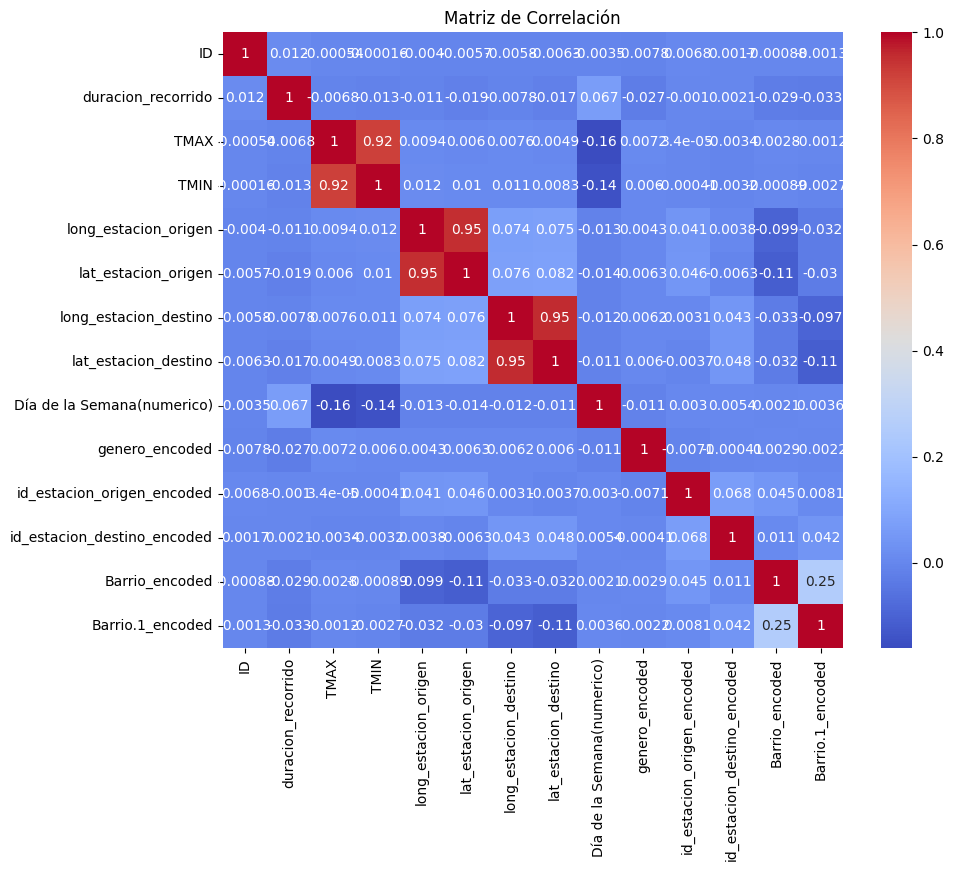

In [ ]:
# Analisis multivariado seleccionando solo columnas con valores numericos

# Se toman solo las columnas con valores numéricos
numeric_cols = df.select_dtypes(include=np.number).columns

# Matriz de correlación
correlation_matrix = df[numeric_cols].corr()

# Se muestra la atriz de correlación usando un mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Matriz de Correlación')
plt.show()


Conclusiones EDA

En un primer acercamiento podemos suponer que los días de semana los viajes tienen una tendencia a ser más cortos, encontrando la curva aproximadamente en 500 segundos. Cuando sumamos otras variables, comos días de semana, observamos que la tendencia de viajes cortos predomina en los días lunes a jueves, mientras que vienres, sabado y domingo tiene una tendencia a ser mas largos, principalmente sabados y domingos.

# Feature Selection

Seleccion de variables objetivo y variables independientes

In [ ]:
# Se considera la duracion de recorrido como variable objetivo

X = df.drop('duracion_recorrido', axis=1)
y = df['duracion_recorrido']


In [ ]:
# Variables independientes
X.columns

Index(['ID', 'Id_recorrido', 'fecha_origen_recorrido', 'TMAX', 'TMIN',
       'id_estacion_origen', 'nombre_estacion_origen', 'Barrio', 'Comuna',
       'Emplazamiento', 'direccion_estacion_origen', 'long_estacion_origen',
       'lat_estacion_origen', 'fecha_destino_recorrido', 'id_estacion_destino',
       'nombre_estacion_destino', 'Barrio.1', 'Comuna.1', 'Emplazamiento.1',
       'direccion_estacion_destino', 'long_estacion_destino',
       'lat_estacion_destino', 'id_usuario', 'modelo_bicicleta', 'genero',
       'Día de la Semana(numerico)', 'genero_encoded',
       'id_estacion_origen_encoded', 'id_estacion_destino_encoded',
       'Barrio_encoded', 'Barrio.1_encoded'],
      dtype='object')

In [ ]:
# Variable dependiente
y.sample(10)

,duracion_recorrido
39547,732.0
74338,833.0
29087,946.0
84714,653.0
47756,2071.0
13970,1842.0
61492,258.0
24228,833.0
40559,130.0
74769,810.0



# Modelos

Librerias necesarias para implementar los modelos

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
# Se prueba un modelo de machinlearning

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Se seleccionana solo las columnas numéricas para el modelo
X_numeric = X.select_dtypes(include=np.number)

# Se dividen los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_numeric, y, test_size=0.2, random_state=42)

# Se crea un modelo de regresión lineal
model = LinearRegression()

# Se entrena el modelo
model.fit(X_train, y_train)

# Se hace predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

# Se evalua el modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")


Mean Squared Error: 289756.3904470822
R-squared: 0.011154073238229367


In [ ]:
# Se prueba otro modelo, arbol de decision

from sklearn.tree import DecisionTreeRegressor

# Se crea el modelo de árbol de decisión
tree_model = DecisionTreeRegressor(random_state=42)

# Se entrena el modelo
tree_model.fit(X_train, y_train)

# Se hace predicciones en el conjunto de prueba
y_pred_tree = tree_model.predict(X_test)

# Se evalua el modelo
mse_tree = mean_squared_error(y_test, y_pred_tree)
r2_tree = r2_score(y_test, y_pred_tree)

print(f"Decision Tree - Mean Squared Error: {mse_tree}")
print(f"Decision Tree - R-squared: {r2_tree}")


Decision Tree - Mean Squared Error: 425786.7991200928
Decision Tree - R-squared: -0.4530742232438514


Conclusion sobre el modelado y las metricas

Se entrena el modelo de regresion lineal con los datos de entrenamiento y evaluamos su rendimiento con los datos de prueba.

# Conclusiones finales

En primer lugar se probo con un modelo de regresion lineal, por los resultados que se obtienen del MSE, se entiende que los valores no se estarían ajustando  a los datos. Y por el valor de R2, entendemos que no hay una buena relación entre variables. Podríamos indicar que el modelo de regresión no sería adecuado para los datos que se usaron. Luego se pobo con el modelo de arbol de decisión, obteniendo un MSE bastante alto, llegando a la misma consideración que el modelo lineal. Y al obtener un R2 negativo, podríamos entender que el modelo tampoco es el indicado para los datos.
De esta forma, lo ideal sería revisar las características utilizadas o considerar otro tipo de modelo o recurrir a otros datos que se relacionen mejor con la variable objetivo.